# Image Classification with Pretrained VGG-16 Models  

---

## Data Preparation  
- Downloaded the dataset from the provided [Google Drive link](https://drive.google.com/open?id=1Z4TyI7FcFVEx8qdl4jO9qxvxaqLSqoEu), which included images and a label file in the specified format:  
  `path/to/image.tif,category`.  
- Categories were correctly mapped from 0 to 15, covering various document types such as letters, forms, advertisements, and memos.  
- Split the data into training and validation sets for model training.  

## Image Generators  
- Implemented batch-wise data loading using the `ImageDataGenerator` class to handle memory constraints efficiently.  
- Followed the references provided to implement generators, ensuring images were preprocessed and augmented during training:  
  - [Tutorial 1](https://medium.com/@vijayabhaskar96/tutorial-on-keras-imagedatagenerator-with-flow-from-dataframe-8bd5776e45c1)  
  - [Tutorial 2](https://medium.com/@vijayabhaskar96/tutorial-on-keras-flow-from-dataframe-1fd4493d237c)  

## Hyperparameters and Training  
- Experimented with various learning rates, optimizers, and loss functions for optimal performance.  
- Used data augmentation techniques to improve model generalization.  

## TensorBoard Analysis  
- Utilized TensorBoard to monitor training metrics, including gradients, accuracy, and loss.  
- Debugged issues with the `fit_generator()` method and successfully logged histograms for gradient analysis.  

---

## Model 1: VGG-16 with New Conv Block  
- **Architecture:**  
  `INPUT --> VGG-16 without Top layers (FC) --> Conv Layer --> Maxpool Layer --> 2 FC layers --> Output Layer`.  
- **Training Details:**  
  - Initialized VGG-16 with pre-trained ImageNet weights.  
  - Added a custom convolutional block, fully connected layers, and an output layer for 16-class classification.  
  - Only trained the newly added layers, freezing the VGG-16 base.  
- **Performance:** Achieved satisfactory accuracy on the validation set while maintaining low computational cost.  

---

## Model 2: VGG-16 with Fully Connected Layers Replaced by Conv Layers  
- **Architecture:**  
  `INPUT --> VGG-16 without Top layers (FC) --> 2 Conv Layers identical to FC --> Output Layer`.  
- **Training Details:**  
  - Converted FC layers into equivalent Conv layers to reduce trainable parameters.  
  - Only trained the last two Conv layers and the output layer, keeping the rest of the network frozen.  
- **Performance:** Successfully reduced the model size while maintaining comparable performance to Model 1.  

---

## Model 3: Fine-tuning VGG-16  
- **Architecture:**  
  Same as Model 2:  
  `INPUT --> VGG-16 without Top layers (FC) --> 2 Conv Layers identical to FC --> Output Layer`.  
- **Training Details:**  
  - Fine-tuned the last six layers of the VGG-16 network along with the Conv and output layers.  
  - Achieved further improvements in accuracy by leveraging transfer learning.  

---

## Observations and Results  
- **Model 1:** Balanced performance with no need for fine-tuning the base VGG-16 network.  
- **Model 2:** Efficient in terms of trainable parameters while retaining performance.  
- **Model 3:** Improved classification accuracy through fine-tuning at the cost of increased training time.  
- TensorBoard visualizations confirmed that gradient updates were effective in training the models.  

---

## Conclusion  
Successfully implemented three VGG-16-based models for document classification, demonstrating the use of transfer learning, custom architectural changes, and fine-tuning to achieve robust performance across 16 categories.  


In [ ]:
#importing some libraries
from tqdm import tqdm_notebook as tqdm
import tensorflow as tf
import os
import numpy as np
import pandas as pd

#import openCV
import cv2

In [ ]:
#to unrar the given file
!pip install pyunpack
!pip install patool
from pyunpack import Archive

In [ ]:
!wget --header="Host: doc-04-a4-docs.googleusercontent.com" --header="User-Agent: Mozilla/5.0 (Windows NT 6.3; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/83.0.4103.106 Safari/537.36" --header="Accept: text/html,application/xhtml+xml,application/xml;q=0.9,image/webp,image/apng,*/*;q=0.8,application/signed-exchange;v=b3;q=0.9" --header="Accept-Language: en-US,en;q=0.9" --header="Referer: https://drive.google.com/" --header="Cookie: AUTH_u14jsrop0mierqufepgi2eki655rmmot_nonce=hng2hq563bdg6" --header="Connection: keep-alive" "https://doc-04-a4-docs.googleusercontent.com/docs/securesc/m2b64dfu34su95s4kfdrhh2k6uc8f9n5/q0hh8h5ir72615r8vdapbmsrka95h6ed/1592672475000/00484516897554883881/11855182677748206568/1Z4TyI7FcFVEx8qdl4jO9qxvxaqLSqoEu?e=download&authuser=0&nonce=hng2hq563bdg6&user=11855182677748206568&hash=260o529obicoeqaijfbtea6hn4k95rf1" -c -O 'rvl-cdip.rar'

--2020-06-20 17:02:28--  https://doc-04-a4-docs.googleusercontent.com/docs/securesc/m2b64dfu34su95s4kfdrhh2k6uc8f9n5/q0hh8h5ir72615r8vdapbmsrka95h6ed/1592672475000/00484516897554883881/11855182677748206568/1Z4TyI7FcFVEx8qdl4jO9qxvxaqLSqoEu?e=download&authuser=0&nonce=hng2hq563bdg6&user=11855182677748206568&hash=260o529obicoeqaijfbtea6hn4k95rf1
Resolving doc-04-a4-docs.googleusercontent.com (doc-04-a4-docs.googleusercontent.com)... 74.125.204.132, 2404:6800:4008:c04::84
Connecting to doc-04-a4-docs.googleusercontent.com (doc-04-a4-docs.googleusercontent.com)|74.125.204.132|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [application/rar]
Saving to: ‘rvl-cdip.rar’

rvl-cdip.rar            [ <=>                ]   4.34G  34.9MB/s    in 86s     

2020-06-20 17:03:54 (51.9 MB/s) - ‘rvl-cdip.rar’ saved [4660541790]



In [ ]:
#unrar the file in the dest. folder
Archive('/content/rvl-cdip.rar').extractall('/content/Assignment 21')

In [ ]:
dir_path = "/content/Assignment 21/data_final"

In [ ]:
#reading the path file in pandas dataframe
data=pd.read_csv('/content/Assignment 21/labels_final.csv')

In [ ]:
data.shape

(48000, 2)

In [ ]:
data.head()

,path,label
0,imagesv/v/o/h/voh71d00/509132755+-2755.tif,3
1,imagesl/l/x/t/lxt19d00/502213303.tif,3
2,imagesx/x/e/d/xed05a00/2075325674.tif,2
3,imageso/o/j/b/ojb60d00/517511301+-1301.tif,3
4,imagesq/q/z/k/qzk17e00/2031320195.tif,7


In [ ]:
#formatting the labels into categoricals values

for i in tqdm(range(len(data))):
    if data['label'][i]==0:
        data['label'][i]='letter'
    if data['label'][i]==1:
        data['label'][i]='form'
    if data['label'][i]==2:
        data['label'][i]='email'
    if data['label'][i]==3:
        data['label'][i]='handwritten'
    if data['label'][i]==4:
        data['label'][i]='advertisement'
    if data['label'][i]==5:
        data['label'][i]='scientific report'
    if data['label'][i]==6:
        data['label'][i]='scientific publication'
    if data['label'][i]==7:
        data['label'][i]='specification'
    if data['label'][i]==8:
        data['label'][i]='file folder'
    if data['label'][i]==9:
        data['label'][i]='news article'
    if data['label'][i]==10:
        data['label'][i]='budget'
    if data['label'][i]==11:
        data['label'][i]='invoice'
    if data['label'][i]==12:
        data['label'][i]='presentation'
    if data['label'][i]==13:
        data['label'][i]='questionnaire'
    if data['label'][i]==14:
        data['label'][i]='resume'
    if data['label'][i]==15:
        data['label'][i]='memo'

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  This is separate from the ipykernel package so we can avoid doing imports until


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # This is added back by InteractiveShellApp.init_path()
/usr/local/lib/python3.6/dist-packages/pandas/core/indexing.py:671: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)


In [ ]:
data.head()

,path,label
0,imagesv/v/o/h/voh71d00/509132755+-2755.tif,handwritten
1,imagesl/l/x/t/lxt19d00/502213303.tif,handwritten
2,imagesx/x/e/d/xed05a00/2075325674.tif,email
3,imageso/o/j/b/ojb60d00/517511301+-1301.tif,handwritten
4,imagesq/q/z/k/qzk17e00/2031320195.tif,specification


In [ ]:
from sklearn.model_selection import train_test_split
#splitting the data into train and test
train_data_df,test_data_df=train_test_split(data, test_size=0.2, stratify=data['label'])

In [ ]:
test_data_df.shape

(9600, 2)

In [ ]:
img = cv2.imread('/content/Assignment 21/data_final/imagesa/a/a/a/aaa11d00/515558347+-8348.tif', cv2.IMREAD_UNCHANGED)

In [ ]:
img.shape

(1000, 754)

In [ ]:
###Image data Generator class
ImageFlow = tf.keras.preprocessing.image.ImageDataGenerator()
# fitting the data to Image data generator.
#using the
ImageGenerator_train = ImageFlow.flow_from_dataframe(train_data_df,directory='/content/Assignment 21/data_final',x_col='path',
                                                     y_col='label',batch_size=100,seed=30,class_mode='categorical',target_size=(224,224))

ImageGenerator_test = ImageFlow.flow_from_dataframe(test_data_df,directory='/content/Assignment 21/data_final',x_col='path',
                                                     y_col='label',batch_size=100,seed=30,class_mode='categorical',target_size=(224,224))


Found 38400 validated image filenames belonging to 16 classes.
Found 9600 validated image filenames belonging to 16 classes.


In [ ]:
#clearing the tensorflow graph
tf.keras.backend.clear_session()

In [ ]:
#creating a pretrained model
IMG_SHAPE = (224, 224, 3)
base_model = tf.keras.applications.VGG16(input_shape=IMG_SHAPE,
                                               include_top=False,
                                               weights='imagenet')


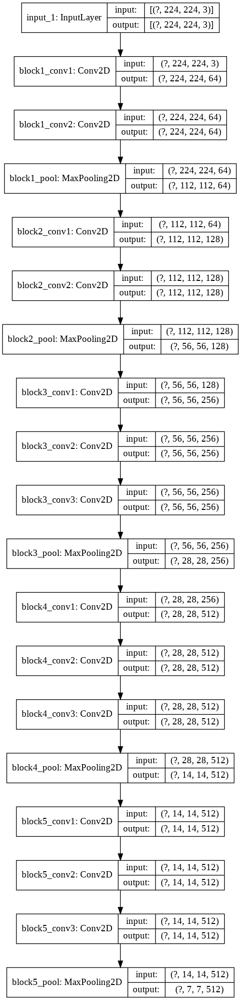

In [ ]:
# summarize the model
from tensorflow.keras.utils import plot_model
plot_model(base_model, 'base_model.png', show_shapes=True)

In [ ]:
#pretrained model VGG16 summary
base_model.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0     

In [ ]:
#setting the trainable parameters to false so that we can use the pretrained parameters
base_model.trainable = False

In [ ]:
#importing some more libraries
from tensorflow.keras.layers import Dense,Input,Conv2D,MaxPool2D,Activation,Dropout,Flatten
from tensorflow.keras.models import Model
import random as rn

#Model 1

In [ ]:
#clearing the tf graph
tf.keras.backend.clear_session()
#clear the tensorboard graph
tf.compat.v1.reset_default_graph()

In [ ]:
import datetime
!rm -rf ./logs/  # clearing the previous logs
log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S") # defing the log_dir
#loading the tensorboard extension
%load_ext tensorboard


In [ ]:
#built-in tensorboard call back
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1,write_graph=True,write_grads=True)

#importing the ealy stopping for accuracy
ES=tf.keras.callbacks.EarlyStopping(
    monitor='val_accuracy', min_delta=0, patience=3, verbose=0, mode='auto',
    baseline=None, restore_best_weights=True
)

callback_list=[tensorboard_callback,ES]

In [ ]:
input_layer=base_model.layers[-1].output #adding the conv layer on top of VGG16 layer

# conv layer
Conv_1 = Conv2D(filters=512,kernel_size=(2,2),strides=(1,1),padding='valid',data_format='channels_last',
              activation='relu')(input_layer)

#dropout layer
dropout_1=Dropout(0.3)(Conv_1)

#Maxpool layer
Pool_1 = MaxPool2D(pool_size=(2,2),strides=(1,1),padding='valid',data_format='channels_last')(dropout_1)

#flattening to last layer
flatten = Flatten()(Pool_1)

drop_1=Dropout(0.5)(flatten)

#FC layer
FC1 = Dense(units=64,activation='relu',kernel_initializer=tf.keras.initializers.glorot_normal)(flatten)

#FC layer
FC2 = Dense(units=32,activation='relu',kernel_initializer=tf.keras.initializers.glorot_normal)(FC1)

#output layer
Out = Dense(units=16,activation='softmax',kernel_initializer=tf.keras.initializers.glorot_normal)(FC2)


In [ ]:
#Creating a model
model = Model(inputs=base_model.input,outputs=Out)

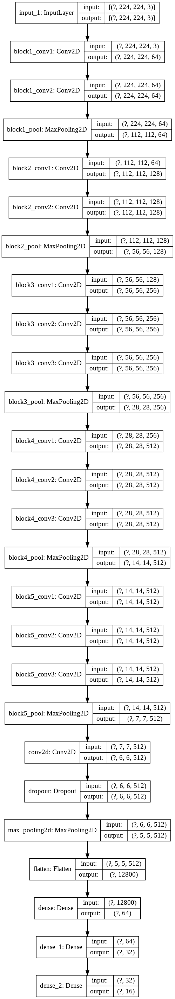

In [ ]:
# summarize the model
from tensorflow.keras.utils import plot_model
plot_model(model, 'model.png', show_shapes=True)

In [ ]:
model.summary()#printing the summary of Model 1

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0     

In [ ]:
#setting the learnig rate
base_learning_rate = 0.001
#compiling our Model 1
model.compile(optimizer=tf.keras.optimizers.Adam(lr=base_learning_rate),
              loss=tf.keras.losses.CategoricalCrossentropy(from_logits=False),
              metrics=['accuracy'])

In [ ]:
model.fit(ImageGenerator_train,steps_per_epoch=384, epochs=10,validation_data=ImageGenerator_test,validation_steps=96,callbacks=callback_list)

Epoch 1/10
 71/384 [====>.........................] - ETA: 6:06 - loss: 6.7679 - accuracy: 0.1699

In [ ]:
#we can get better train and validation accuracies by increasing the no. of epochs

In [ ]:
#loading the tensorboard extension
%load_ext tensorboard

%tensorboard --logdir logs/fit/ #to launch tensorboard
#screenshots have been attached in the seperate pdf file

#Observations (Model and Histograms) :

(1) As we have VGG16-pretrained model weights to train on our dataset, we have achieved a max validation accuracy of around 68%.

(2) Trainable parameters were 1,870,960.

(3) The accuracy can be justified as we have very small amount of training data.

(4) The HISTOGRAMS of all the Kernel weights were zero-centered and somewhat following a guassian distribution after every epoch.

(5) The weights of Dense layers for each epoch were between -0.5 and 0.5

Note: The screenshots of epoch loss and epoch accuracy for each model has been attached in a pdf file.


#Model 2

In [ ]:
#clearing the tf graph
tf.keras.backend.clear_session()
#clear the tensorboard graph
tf.compat.v1.reset_default_graph()

#trainable parameters of pretrainrd model set to 0
base_model.trainable = False

import datetime
!rm -rf ./logs/  # clearing the previous logs
log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S") # defing the log_dir

In [ ]:
#built-in tensorboard call back
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1,write_graph=True,write_grads=True)

#importing the ealy stopping for val_accuracy
ES=tf.keras.callbacks.EarlyStopping(
    monitor='val_accuracy', min_delta=0, patience=3, verbose=0, mode='auto',
    baseline=None, restore_best_weights=True
)

callback_list=[tensorboard_callback,ES]

In [ ]:
input_layer=base_model.layers[-1].output

#CONV layers identical to FC layer 1 and 2

Conv_1 = Conv2D(filters=64,kernel_size=(7,7),strides=(1,1),padding='valid',data_format='channels_last',
              activation='relu')(input_layer)

#dropout_1=Dropout(0.5)(Conv_1)

Conv_2 = Conv2D(filters=32,kernel_size=(1,1),strides=(1,1),padding='valid',data_format='channels_last',
              activation='relu')(Conv_1)

dropout_2=Dropout(0.4)(Conv_2)

#to fit in shape adding a pooling layer to a CONV layer
flatten=Flatten()(dropout_2)
#Output layer
Out = Dense(units=16,activation='softmax',kernel_initializer=tf.keras.initializers.glorot_normal)(flatten)


In [ ]:
#Creating a model
model_2 = Model(inputs=base_model.input,outputs=Out)

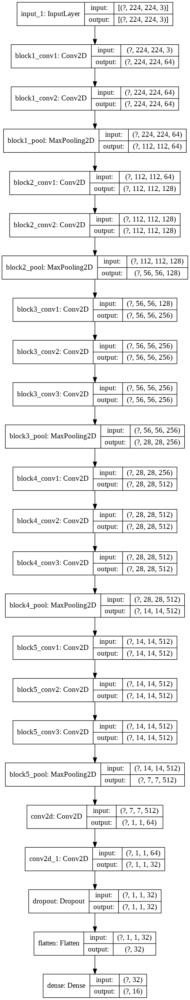

In [ ]:
# summarize the model
from tensorflow.keras.utils import plot_model
plot_model(model_2, 'model_2.png', show_shapes=True)

In [ ]:
model_2.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0     

In [ ]:
#learing rate for optimizer
base_learning_rate = 0.001
#compiling the model
model_2.compile(optimizer=tf.keras.optimizers.Adam(lr=base_learning_rate),
              loss=tf.keras.losses.CategoricalCrossentropy(from_logits=False),
              metrics=['accuracy'])

In [ ]:
len(model_2.trainable_variables)

6

In [ ]:
model_2.fit(ImageGenerator_train,steps_per_epoch=384, epochs=10,validation_data=ImageGenerator_test,validation_steps=96,callbacks=callback_list)

Epoch 1/10
384/384 [==============================] - 567s 1s/step - loss: 2.7665 - accuracy: 0.1594 - val_loss: 2.3067 - val_accuracy: 0.2473
Epoch 2/10
384/384 [==============================] - 566s 1s/step - loss: 2.4347 - accuracy: 0.2078 - val_loss: 2.2784 - val_accuracy: 0.2518
Epoch 3/10
384/384 [==============================] - 566s 1s/step - loss: 2.3588 - accuracy: 0.2210 - val_loss: 2.1983 - val_accuracy: 0.2807
Epoch 4/10
384/384 [==============================] - 566s 1s/step - loss: 2.2806 - accuracy: 0.2370 - val_loss: 2.1043 - val_accuracy: 0.3153
Epoch 5/10
384/384 [==============================] - 566s 1s/step - loss: 2.1947 - accuracy: 0.2653 - val_loss: 2.0630 - val_accuracy: 0.3394
Epoch 6/10
384/384 [==============================] - 566s 1s/step - loss: 2.0901 - accuracy: 0.3035 - val_loss: 1.9003 - val_accuracy: 0.3793
Epoch 7/10
384/384 [==============================] - 566s 1s/step - loss: 2.0042 - accuracy: 0.3252 - val_loss: 1.8344 - val_accuracy: 0.4129

In [ ]:
#we can get better train and validation accuracies by increasing the no. of epochs

In [ ]:
!kill 3484

/bin/bash: line 0: kill: (3484) - No such process


In [ ]:
#loading the tensorboard extension
%reload_ext tensorboard

%tensorboard --logdir logs/fit/ #to launch tensorboard
#screenshots have been attached in the seperate pdf file

#Observations (Model and Histograms) :

(1)We have used VGG16-pretrained model weights to train on our dataset, but used COnv layers instead of FC layers,  we have achieved a max validation accuracy of around 48%, for 10 epochs

(2) Trainable parameters were 1,608,304, less than we used for model-1

(3) The accuracy can be justified as we have very small no.of epochs we have taken due to memory constraints. We can definitely increase the accuracy with some hyperparameter tuning too.

(4) Model 2 will give more accuracy than Model-1 as we have added a Conv layer instead of FC layer. The advantages of using Conv layer is given in:https://cs231n.github.io/convolutional-networks/#convert

(5) The HISTOGRAMS of all the Kernel weights were zero-centered and somewhat following a guassian distribution after every epoch (for most of the kernels)

(6) The Conv_1 layer kernel weights have been following somewhat uniform distribution. ranging b/w -0.25 to 0.25

(7) The weights of Dense layers for each epoch were between -0.5 and 0.5

Note: The screenshots of epoch loss and epoch accuracy for each model has been attached in a pdf file.




#Model 3

In [ ]:
#clearing the graph
tf.keras.backend.clear_session()
#clear the tensorboard graph
tf.compat.v1.reset_default_graph()

import datetime
!rm -rf ./logs/  # clearing the previous logs
log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S") # defing the log_dir

#loading the tensorboard extension
%load_ext tensorboard

In [ ]:
#built-in tensorboard call back
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1,write_graph=True,write_grads=True)

#importing the ealy stopping for val_accuracy
ES=tf.keras.callbacks.EarlyStopping(
    monitor='val_accuracy', min_delta=0, patience=2, verbose=0, mode='auto',
    baseline=None, restore_best_weights=True
)

callback_list=[tensorboard_callback,ES]

In [ ]:
#fine tuning the model upto 6 layers
base_model.trainable = True

In [ ]:
base_model.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0     

In [ ]:
input_layer=base_model.layers[-1].output

##CONV layers identical to FC layer 1 and 2
Conv_1 = Conv2D(filters=128,kernel_size=(7,7),strides=(1,1),padding='valid',data_format='channels_last',
              activation='relu')(input_layer)

#dropout_1=Dropout(0.3)(Conv_1)

Conv_2 = Conv2D(filters=32,kernel_size=(1,1),strides=(1,1),padding='valid',data_format='channels_last',
              activation='relu')(Conv_1)

#dropout_2=Dropout(0.5)(Conv_2)

Pool_2= tf.keras.layers.GlobalAveragePooling2D()(Conv_2)

#flatten=Flatten()(dropout_2)


#Output layer
Out = Dense(units=16,activation='softmax',kernel_initializer=tf.keras.initializers.glorot_normal)(Pool_2)

#Creating a model
model_3 = Model(inputs=base_model.input,outputs=Out)

In [ ]:
# to see how many layers are in the base model
print("Number of layers in the base model: ", len(model_3.layers))

Number of layers in the base model:  23


In [ ]:
#defining the no. of top layers we want to retrain
for layer in model_3.layers[0:13]:
  layer.trainable =  False

#to check how many we will train
n=0
for layer in base_model.layers:
    if layer.trainable==True:
        n+=1

print("No. of layers in pretrained model which will be trained : ",n)

No. of layers in pretrained model which will be trained :  6


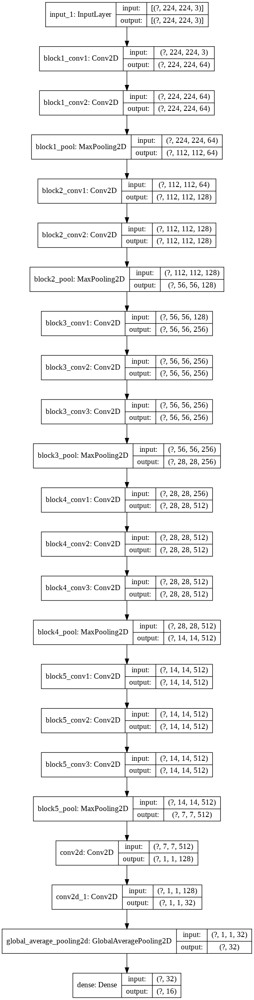

In [ ]:
# summarize the model
from tensorflow.keras.utils import plot_model
plot_model(model_3, 'model_3.png', show_shapes=True)

In [ ]:
model_3.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0     

In [ ]:
#learning rate for optimizer
base_learning_rate = 0.0001

#compiling ther model
model_3.compile(optimizer=tf.keras.optimizers.Adam(lr=base_learning_rate,beta_1=0.85,beta_2=0.90),
              loss=tf.keras.losses.CategoricalCrossentropy(from_logits=False),
              metrics=['accuracy'])

In [ ]:
len(model_3.trainable_variables)

14

In [ ]:
#fiiting the model
%tensorboard --logdir logs/fit/ #to launch tensorboard
#screenshots have been attached in the seperate pdf file

<IPython.core.display.Javascript object>

In [ ]:
model_3.fit(ImageGenerator_train,steps_per_epoch=384, epochs=10,validation_data=ImageGenerator_test,validation_steps=96,callbacks=callback_list)

Epoch 1/10
384/384 [==============================] - 651s 2s/step - loss: 1.6966 - accuracy: 0.5120 - val_loss: 1.1915 - val_accuracy: 0.6598
Epoch 2/10
384/384 [==============================] - 650s 2s/step - loss: 0.9746 - accuracy: 0.7189 - val_loss: 0.9261 - val_accuracy: 0.7343
Epoch 3/10
384/384 [==============================] - 649s 2s/step - loss: 0.7177 - accuracy: 0.7877 - val_loss: 0.8844 - val_accuracy: 0.7499
Epoch 4/10
384/384 [==============================] - 650s 2s/step - loss: 0.5384 - accuracy: 0.8380 - val_loss: 0.8539 - val_accuracy: 0.7656
Epoch 5/10
384/384 [==============================] - 650s 2s/step - loss: 0.3910 - accuracy: 0.8794 - val_loss: 0.9683 - val_accuracy: 0.7735
Epoch 6/10
384/384 [==============================] - 649s 2s/step - loss: 0.2970 - accuracy: 0.9077 - val_loss: 0.9502 - val_accuracy: 0.7675
Epoch 7/10
384/384 [==============================] - 649s 2s/step - loss: 0.2295 - accuracy: 0.9280 - val_loss: 1.0622 - val_accuracy: 0.7759

In [ ]:
#We can get a much higher accuracy by increasing the no. of epochs and hyperparameter tuning, but due to system constraints I will not be able to do here.

In [ ]:
!kill 2475

/bin/bash: line 0: kill: (2475) - No such process


#Observations (Model and Histograms) :

(1)We have used VGG16-pretrained model weights plus the Conv layers to train on our dataset, but the difference is , in addition of only top layers we have also trained the top 6 layers of base_model,  we have achieved a max validation accuracy of around 78%, for 10 epochs

(2) Trainable parameters were 12,655,280, more than we used for model- and model-2

(3) The accuracy can be justified as we have very small no.of epochs we have taken due to memory constraints and we have not addde the dopout layer and not done the hyperparameter tuning. We can definitely increase the accuracy with some hyperparameter tuning too.

(4) Model 3 will give more accuracy than Model-1 and model 2 as we have added a Conv layer instead of FC layer as well as we allowed to train the top layers of base model which moulded the weights and biases as per our dataset. The advantages of using Conv layer is given in:https://cs231n.github.io/convolutional-networks/#convert

(5) The HISTOGRAMS of all the Kernel weights were zero-centered and somewhat following a guassian distribution after every epoch (for most of the kernels)

(6) The Conv_1 layer kernel weights have been following somewhat uniform distribution. ranging b/w -0.25 to 0.25


Note: The screenshots of epoch loss and epoch accuracy for each model has been attached in a pdf file.



